# YOLOV8 to detect objects from images

In [ ]:
!pip install ultralytics

In [ ]:
import cv2
import os
from ultralytics import YOLO
import ultralytics
import tensorflow as tf

In [ ]:
ultralytics.checks()

Ultralytics YOLOv8.1.29 🚀 Python-3.10.12 torch-2.2.1+cu121 CPU (Intel Xeon 2.20GHz)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.6/107.7 GB disk)


In [ ]:
model = YOLO('yolov8n')

In [ ]:
img= cv2.imread('/content/images/3627527276_6fe8cd9bfe_z.jpg')


In [ ]:
results= model(img)


0: 480x640 3 zebras, 1 giraffe, 347.4ms
Speed: 3.2ms preprocess, 347.4ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)


In [ ]:
results

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted p

In [ ]:
detected_classes = results[0].boxes.data
for detected_class in detected_classes:
  print(model.names[int(detected_class[-1])])

giraffe
zebra
zebra
zebra


In [ ]:
model.names[int(detected_class[-1])]

'zebra'

In [ ]:
detected_classes

tensor([[412.9995, 218.1847, 619.2791, 295.1198,   0.9208,  23.0000],
        [ 47.2004, 229.1164, 162.5307, 392.8349,   0.9170,  22.0000],
        [102.7367, 232.4311, 214.4700, 339.7272,   0.8408,  22.0000],
        [254.3555, 238.4285, 343.4719, 270.2596,   0.8281,  22.0000]])

In [ ]:
detected_classes = results[0].boxes.data
for detected_class in detected_classes:
  print(detected_class)
  print(detected_class[-1])

tensor([412.9995, 218.1847, 619.2791, 295.1198,   0.9208,  23.0000])
tensor(23.)
tensor([ 47.2004, 229.1164, 162.5307, 392.8349,   0.9170,  22.0000])
tensor(22.)
tensor([102.7367, 232.4311, 214.4700, 339.7272,   0.8408,  22.0000])
tensor(22.)
tensor([254.3555, 238.4285, 343.4719, 270.2596,   0.8281,  22.0000])
tensor(22.)


In [ ]:
results[0]

ultralytics.engine.results.Results object with attributes:

boxes: ultralytics.engine.results.Boxes object
keypoints: None
masks: None
names: {0: 'person', 1: 'bicycle', 2: 'car', 3: 'motorcycle', 4: 'airplane', 5: 'bus', 6: 'train', 7: 'truck', 8: 'boat', 9: 'traffic light', 10: 'fire hydrant', 11: 'stop sign', 12: 'parking meter', 13: 'bench', 14: 'bird', 15: 'cat', 16: 'dog', 17: 'horse', 18: 'sheep', 19: 'cow', 20: 'elephant', 21: 'bear', 22: 'zebra', 23: 'giraffe', 24: 'backpack', 25: 'umbrella', 26: 'handbag', 27: 'tie', 28: 'suitcase', 29: 'frisbee', 30: 'skis', 31: 'snowboard', 32: 'sports ball', 33: 'kite', 34: 'baseball bat', 35: 'baseball glove', 36: 'skateboard', 37: 'surfboard', 38: 'tennis racket', 39: 'bottle', 40: 'wine glass', 41: 'cup', 42: 'fork', 43: 'knife', 44: 'spoon', 45: 'bowl', 46: 'banana', 47: 'apple', 48: 'sandwich', 49: 'orange', 50: 'broccoli', 51: 'carrot', 52: 'hot dog', 53: 'pizza', 54: 'donut', 55: 'cake', 56: 'chair', 57: 'couch', 58: 'potted plant',

In [ ]:
print(results[0].boxes.data)

tensor([[412.9995, 218.1847, 619.2791, 295.1198,   0.9208,  23.0000],
        [ 47.2004, 229.1164, 162.5307, 392.8349,   0.9170,  22.0000],
        [102.7367, 232.4311, 214.4700, 339.7272,   0.8408,  22.0000],
        [254.3555, 238.4285, 343.4719, 270.2596,   0.8281,  22.0000]])


In [ ]:
import matplotlib.pyplot as plt
import cv2

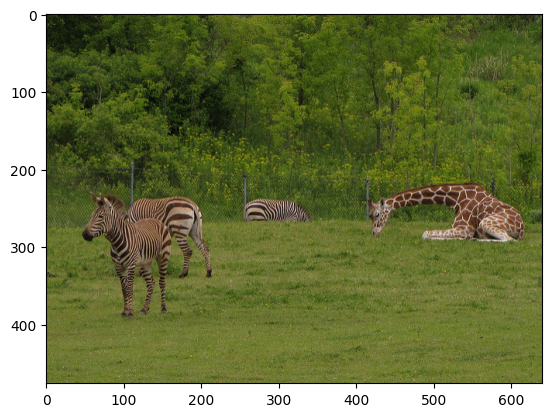

In [ ]:
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

In [ ]:
rect_image = img.copy()
for rect in results[0].boxes.data:
  x_min=int(rect[0])
  y_min=int(rect[1])
  x_max=int(rect[2])
  y_max=int(rect[3])

  rect_image = cv2.rectangle(rect_image,(x_min,y_min),(x_max,y_max),color=(255,0,0))

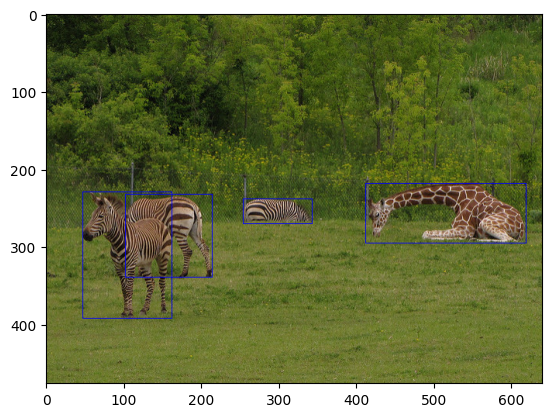

In [ ]:
plt.imshow(cv2.cvtColor(rect_image,cv2.COLOR_BGR2RGB))


tensor([412.9995, 218.1847, 619.2791, 295.1198,   0.9208,  23.0000])
0.9207866787910461
tensor([ 47.2004, 229.1164, 162.5307, 392.8349,   0.9170,  22.0000])
0.9170361161231995
tensor([102.7367, 232.4311, 214.4700, 339.7272,   0.8408,  22.0000])
0.8407906889915466
tensor([254.3555, 238.4285, 343.4719, 270.2596,   0.8281,  22.0000])
0.8280584216117859


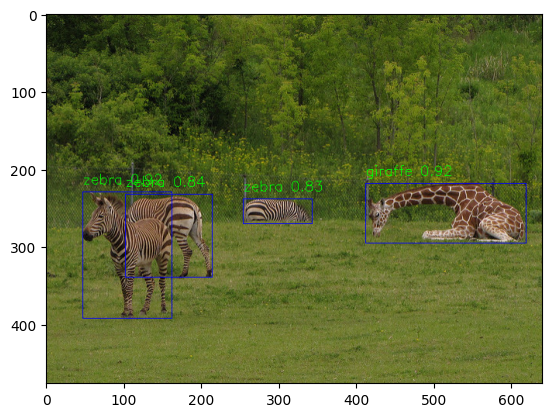

In [ ]:
rect_img = img.copy()
for rect in results[0].boxes.data:
    print(rect)
    x_min = int(rect[0])
    y_min = int(rect[1])
    x_max = int(rect[2])
    y_max = int(rect[3])
    confidence = float(rect[-2])
    print(confidence)
    label = model.names[int(rect[-1])]
    rect_img=cv2.rectangle(rect_img, (x_min, y_min), (x_max, y_max), color=(255, 0, 0))
    rect_img=cv2.putText(rect_img, f"{label} {confidence:.2f}", (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 1)

plt.imshow(cv2.cvtColor(rect_img,cv2.COLOR_BGR2RGB))


In [ ]:
image_dir = '/content/gallery'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')]

In [ ]:
image_files

['25691390_f9944f61b5_z.jpg',
 '3651581213_f81963d1dd_z.jpg',
 '3878153025_8fde829928_z.jpg',
 '8734543718_37f6b8bd45_z.jpg',
 '4410436637_7b0ca36ee7_z.jpg',
 '3627527276_6fe8cd9bfe_z.jpg',
 '8433365521_9252889f9a_z.jpg',
 '8239308689_efa6c11b08_z.jpg',
 '9247489789_132c0d534a_z.jpg',
 '8053677163_d4c8f416be_z.jpg',
 '4782628554_668bc31826_z.jpg',
 '7933423348_c30bd9bd4e_z.jpg',
 '2502287818_41e4b0c4fb_z.jpg',
 '3132016470_c27baa00e8_z.jpg',
 '3862500489_6fd195d183_z.jpg',
 '3800883468_12af3c0b50_z.jpg',
 '8512296263_5fc5458e20_z.jpg',
 '2516944023_d00345997d_z.jpg',
 '8699757338_c3941051b6_z.jpg',
 '1045023827_4ec3e8ba5c_z.jpg',
 '6584515005_fce9cec486_z.jpg',
 '2383514521_1fc8d7b0de_z.jpg',
 '7581246086_cf7bbb7255_z.jpg',
 '262985539_1709e54576_z.jpg',
 '12283150_12d37e6389_z.jpg',
 '6821351586_59aa0dc110_z.jpg',
 '5951960966_d4e1cda5d0_z.jpg',
 '8829708882_48f263491e_z.jpg',
 '9118579087_f9ffa19e63_z.jpg']

In [ ]:
for image_file in image_files:
    # Load the image

    image_path = os.path.join(image_dir, image_file)
    print(image_path)

/content/gallery/25691390_f9944f61b5_z.jpg
/content/gallery/3651581213_f81963d1dd_z.jpg
/content/gallery/3878153025_8fde829928_z.jpg
/content/gallery/8734543718_37f6b8bd45_z.jpg
/content/gallery/4410436637_7b0ca36ee7_z.jpg
/content/gallery/3627527276_6fe8cd9bfe_z.jpg
/content/gallery/8433365521_9252889f9a_z.jpg
/content/gallery/8239308689_efa6c11b08_z.jpg
/content/gallery/9247489789_132c0d534a_z.jpg
/content/gallery/8053677163_d4c8f416be_z.jpg
/content/gallery/4782628554_668bc31826_z.jpg
/content/gallery/7933423348_c30bd9bd4e_z.jpg
/content/gallery/2502287818_41e4b0c4fb_z.jpg
/content/gallery/3132016470_c27baa00e8_z.jpg
/content/gallery/3862500489_6fd195d183_z.jpg
/content/gallery/3800883468_12af3c0b50_z.jpg
/content/gallery/8512296263_5fc5458e20_z.jpg
/content/gallery/2516944023_d00345997d_z.jpg
/content/gallery/8699757338_c3941051b6_z.jpg
/content/gallery/1045023827_4ec3e8ba5c_z.jpg
/content/gallery/6584515005_fce9cec486_z.jpg
/content/gallery/2383514521_1fc8d7b0de_z.jpg
/content/gal

/content/gallery/25691390_f9944f61b5_z.jpg

0: 416x640 13 persons, 7 cars, 1 bus, 1 umbrella, 267.2ms
Speed: 2.5ms preprocess, 267.2ms inference, 1.8ms postprocess per image at shape (1, 3, 416, 640)


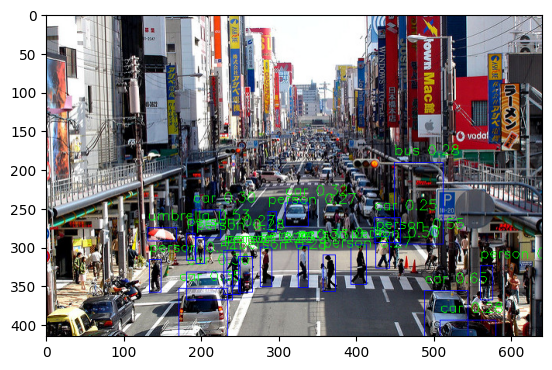

/content/gallery/3651581213_f81963d1dd_z.jpg

0: 640x480 12 persons, 1 backpack, 4 umbrellas, 1 potted plant, 351.5ms
Speed: 2.4ms preprocess, 351.5ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 480)


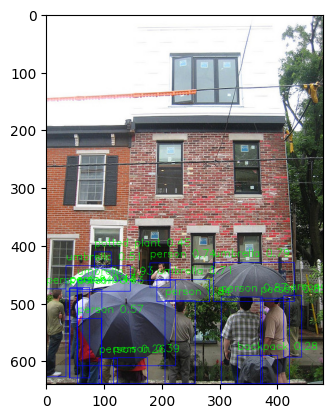

/content/gallery/3878153025_8fde829928_z.jpg

0: 448x640 3 chairs, 1 couch, 1 potted plant, 1 bed, 292.0ms
Speed: 5.8ms preprocess, 292.0ms inference, 1.7ms postprocess per image at shape (1, 3, 448, 640)


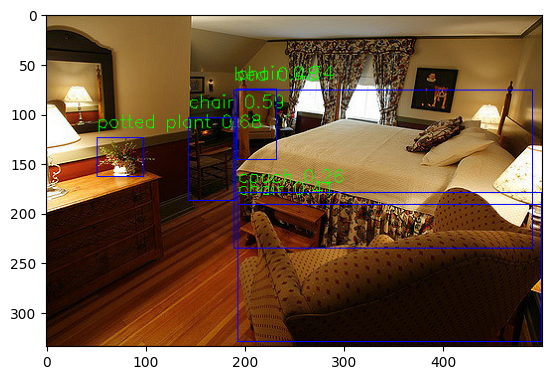

/content/gallery/8734543718_37f6b8bd45_z.jpg

0: 416x640 9 donuts, 241.0ms
Speed: 2.1ms preprocess, 241.0ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)


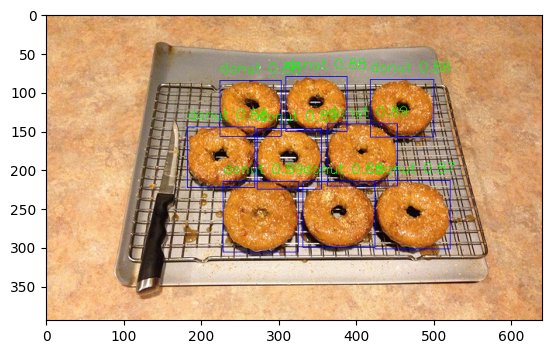

/content/gallery/4410436637_7b0ca36ee7_z.jpg

0: 448x640 4 persons, 1 snowboard, 284.6ms
Speed: 2.1ms preprocess, 284.6ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


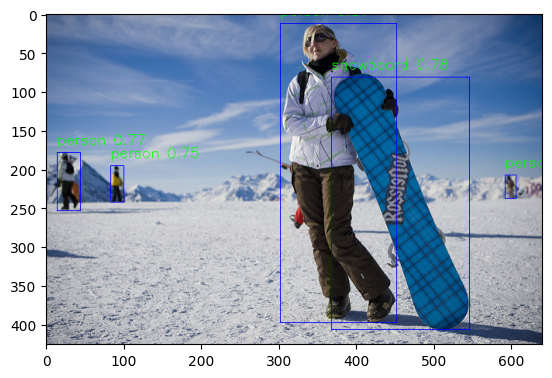

/content/gallery/3627527276_6fe8cd9bfe_z.jpg

0: 480x640 3 zebras, 1 giraffe, 315.1ms
Speed: 2.7ms preprocess, 315.1ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


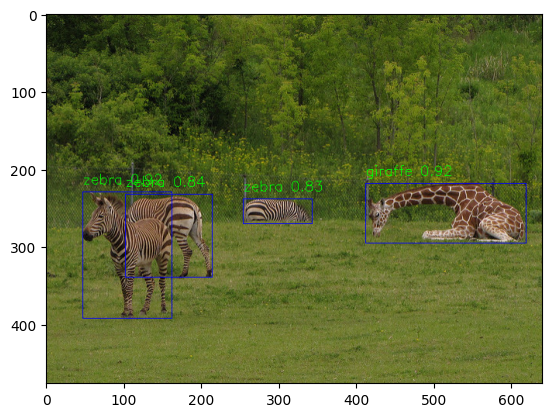

/content/gallery/8433365521_9252889f9a_z.jpg

0: 448x640 1 person, 1 horse, 270.0ms
Speed: 2.2ms preprocess, 270.0ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


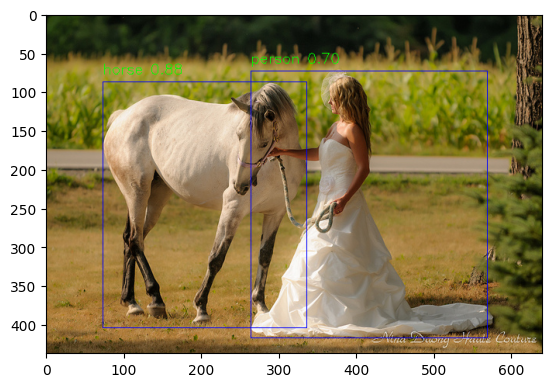

/content/gallery/8239308689_efa6c11b08_z.jpg

0: 448x640 3 persons, 4 cars, 1 bus, 228.1ms
Speed: 2.2ms preprocess, 228.1ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


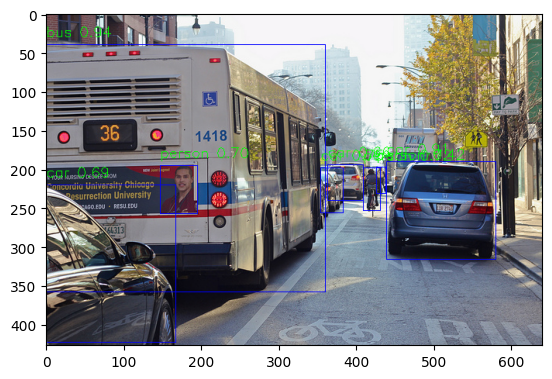

/content/gallery/9247489789_132c0d534a_z.jpg

0: 512x640 5 persons, 3 benchs, 3 handbags, 256.3ms
Speed: 2.6ms preprocess, 256.3ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)


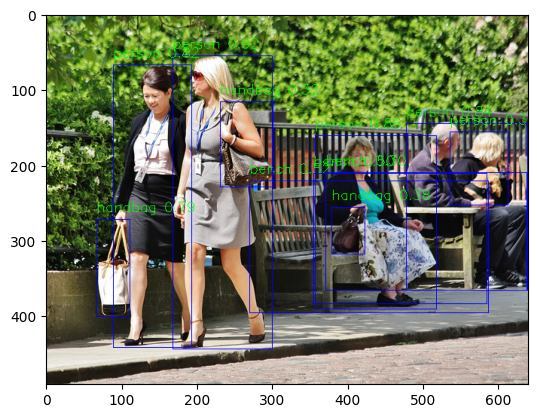

/content/gallery/8053677163_d4c8f416be_z.jpg

0: 448x640 13 cars, 1 bus, 3 trucks, 284.5ms
Speed: 2.2ms preprocess, 284.5ms inference, 1.9ms postprocess per image at shape (1, 3, 448, 640)


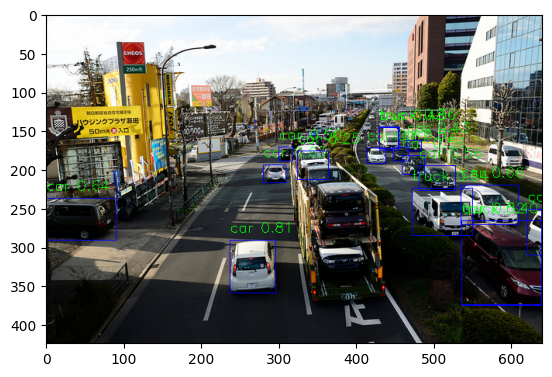

In [ ]:
label_counts = {}

# Loop over each image file
for image_file in image_files[:10]:
    # Load the image
    image_path = os.path.join(image_dir, image_file)
    print(image_path)
    image = cv2.imread(image_path)
    results= model(image)
    det_img = image.copy()
    for rect in results[0].boxes.data:
        x_min = int(rect[0])
        y_min = int(rect[1])
        x_max = int(rect[2])
        y_max = int(rect[3])
        confidence = float(rect[-2])
        label = model.names[int(rect[-1])]
        # Increment count for the label in the dictionary
        if label in label_counts:
            label_counts[label] += 1
        else:
            label_counts[label] = 1
        rect_img=cv2.rectangle(det_img, (x_min, y_min), (x_max, y_max), color=(255, 0, 0))
        rect_img=cv2.putText(det_img, f"{label} {confidence:.2f}", (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 1)
    plt.imshow(cv2.cvtColor(rect_img,cv2.COLOR_BGR2RGB))
    plt.show()


In [ ]:
# Display the label counts
print("Label Counts:")
for label, count in label_counts.items():
    print(f"{label}: {count}")

Label Counts:
car: 24
person: 38
umbrella: 5
bus: 3
potted plant: 2
backpack: 1
chair: 3
bed: 1
couch: 1
donut: 9
snowboard: 1
giraffe: 1
zebra: 3
horse: 1
handbag: 3
bench: 3
truck: 3


In [ ]:
image_dir = '/content/galleryall'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')]

In [ ]:
label_counts = {}

# Loop over each image file
for image_file in image_files:
    # Load the image
    image_path = os.path.join(image_dir, image_file)
    image = cv2.imread(image_path)
    results= model(image)
    for rect in results[0].boxes.data:
        confidence = float(rect[-2])
        label = model.names[int(rect[-1])]
        # Increment count for the label in the dictionary
        if label in label_counts:
            label_counts[label] += 1
        else:
            label_counts[label] = 1


0: 480x640 (no detections), 187.7ms
Speed: 5.0ms preprocess, 187.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)

0: 640x480 (no detections), 183.7ms
Speed: 7.5ms preprocess, 183.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 480)

0: 640x480 2 persons, 191.7ms
Speed: 5.2ms preprocess, 191.7ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)

0: 512x640 1 person, 184.4ms
Speed: 5.6ms preprocess, 184.4ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)

0: 640x480 6 persons, 5 motorcycles, 1 truck, 181.1ms
Speed: 5.9ms preprocess, 181.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

0: 512x640 (no detections), 193.6ms
Speed: 5.0ms preprocess, 193.6ms inference, 1.3ms postprocess per image at shape (1, 3, 512, 640)

0: 640x512 1 person, 188.4ms
Speed: 6.2ms preprocess, 188.4ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 512)

0: 640x512 1 person, 1 book, 197.6ms
Speed: 5.9ms prepro

In [ ]:
# Display the label counts
print("Label Counts:")
for label, count in label_counts.items():
    print(f"{label}: {count}")

Label Counts:
person: 340
truck: 4
motorcycle: 5
book: 4
car: 10
refrigerator: 3
bench: 6
chair: 43
airplane: 5
kite: 9
cake: 2
potted plant: 6
horse: 1
umbrella: 4
laptop: 5
tie: 8
frisbee: 1
bird: 6
cell phone: 2
tv: 3
carrot: 4
pizza: 2
sandwich: 2
bowl: 4
dining table: 2
handbag: 5
bottle: 1
remote: 1
suitcase: 2
clock: 1
bus: 4
parking meter: 1
bed: 2
boat: 1
giraffe: 1
backpack: 2
banana: 1
cup: 2
orange: 1
train: 1
cat: 1


/content/galleryall/20231025_080525.jpg

0: 480x640 (no detections), 280.9ms
Speed: 5.0ms preprocess, 280.9ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


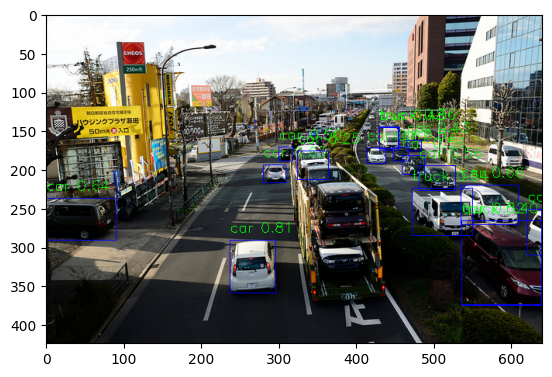

/content/galleryall/20240316_092227.jpg

0: 640x480 (no detections), 178.6ms
Speed: 11.2ms preprocess, 178.6ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 480)


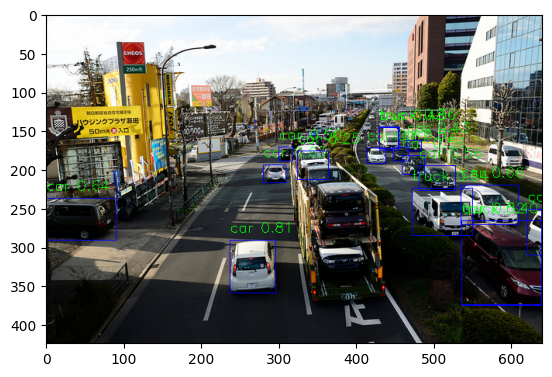

/content/galleryall/PXL_20240124_101346455.jpg

0: 640x480 2 persons, 203.6ms
Speed: 5.0ms preprocess, 203.6ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


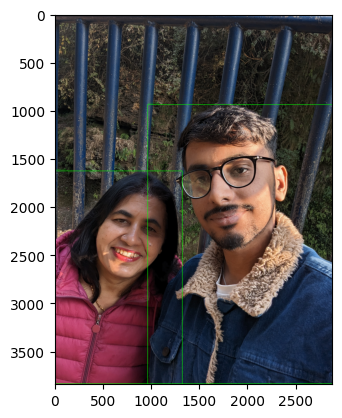

/content/galleryall/PXL_20240203_093439624.jpg

0: 512x640 1 person, 250.0ms
Speed: 5.3ms preprocess, 250.0ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


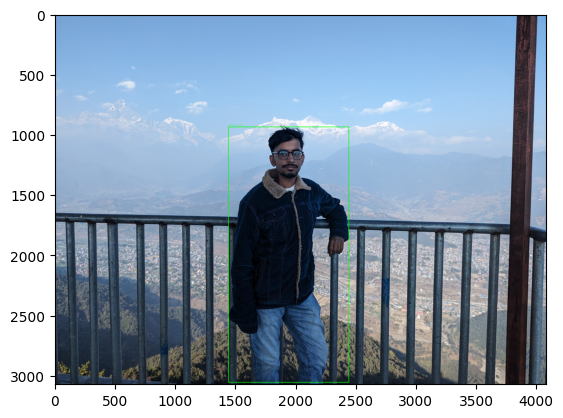

/content/galleryall/20231113_191439.jpg

0: 640x480 6 persons, 5 motorcycles, 1 truck, 191.0ms
Speed: 6.2ms preprocess, 191.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)


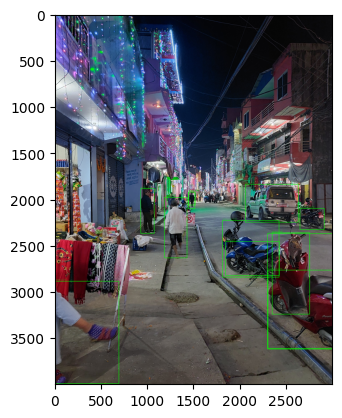

/content/galleryall/PXL_20240203_093130555.jpg

0: 512x640 (no detections), 194.4ms
Speed: 7.0ms preprocess, 194.4ms inference, 1.0ms postprocess per image at shape (1, 3, 512, 640)


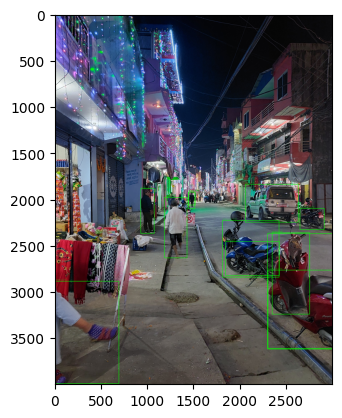

/content/galleryall/PXL_20240203_084939574.jpg

0: 640x512 1 person, 306.3ms
Speed: 5.2ms preprocess, 306.3ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 512)


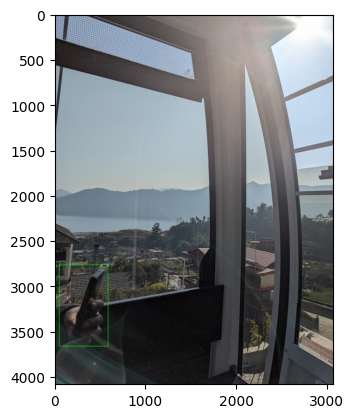

/content/galleryall/PXL_20240228_042527098.jpg

0: 640x512 1 person, 1 book, 210.9ms
Speed: 8.3ms preprocess, 210.9ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 512)


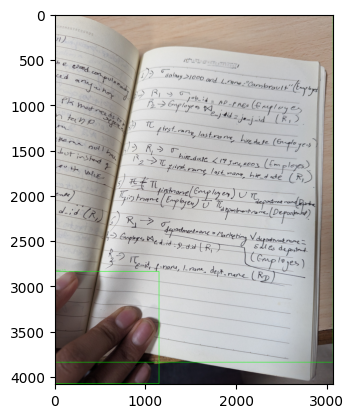

/content/galleryall/Screenshot_20240207-000245.png

0: 640x320 1 car, 143.6ms
Speed: 4.0ms preprocess, 143.6ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 320)


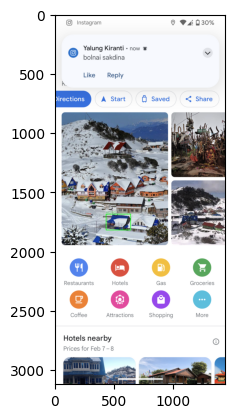

/content/galleryall/PXL_20240203_091437967.jpg

0: 512x640 1 person, 220.2ms
Speed: 5.0ms preprocess, 220.2ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)


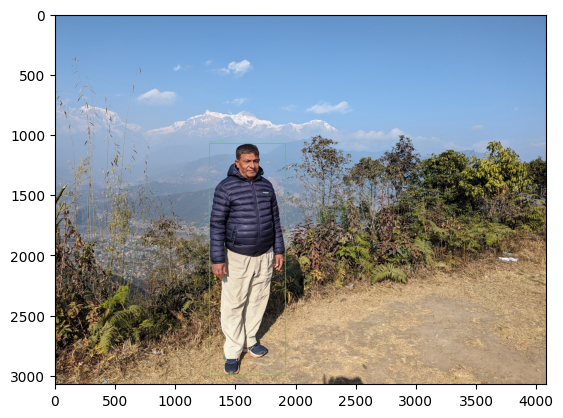

In [ ]:
image_dir = '/content/galleryall'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')]

# Loop over each image file
for image_file in image_files[:10]:
    # Load the image
    image_path = os.path.join(image_dir, image_file)
    print(image_path)
    image = cv2.imread(image_path)
    results= model(image)
    det_img = image.copy()
    for rect in results[0].boxes.data:
        x_min = int(rect[0])
        y_min = int(rect[1])
        x_max = int(rect[2])
        y_max = int(rect[3])
        confidence = float(rect[-2])
        label = model.names[int(rect[-1])]
        rect_img = cv2.rectangle(det_img, (x_min, y_min), (x_max, y_max), color=(0, 255, 0), thickness=3)
        rect_img=cv2.putText(det_img, f"{label} {confidence:.2f}", (x_min, y_min - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 1)
    plt.imshow(cv2.cvtColor(rect_img,cv2.COLOR_BGR2RGB))
    plt.show()

In [ ]:
df_label_counts = pd.DataFrame(list(label_counts.items()), columns=['label','Count'])
df_label_counts = df_label_counts.sort_values(by='Count',ascending=False)
df_label_counts

,label,Count
0,person,12
2,motorcycle,5
1,truck,1
3,book,1
4,car,1


In [ ]:
import pandas as pd

In [ ]:
data = []
label_countsall={}
for image_file in image_files:
    # Load the image
    image_path = os.path.join(image_dir, image_file)
    print(image_path)
    image = cv2.imread(image_path)
    results = model(image)

    # Process detection results
    for rect in results[0].boxes.data:
        # Extract detection information
        x_min = int(rect[0])
        y_min = int(rect[1])
        x_max = int(rect[2])
        y_max = int(rect[3])
        confidence = float("{:.2f}".format(float(rect[-2])))
        label = model.names[int(rect[-1])]
        if label in label_countsall:
            label_countsall[label] += 1
        else:
            label_countsall[label] = 1

        # Append detection information to the data list
        data.append({
            'ImageFilename': image_file,
            'Label': label,
            'Confidence': confidence,
            'XMin': x_min,
            'XMax': x_max,
            'YMin': y_min,
            'YMax': y_max
        })

df = pd.DataFrame(data)


/content/galleryall/20231025_080525.jpg

0: 480x640 (no detections), 217.0ms
Speed: 7.4ms preprocess, 217.0ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)
/content/galleryall/20240316_092227.jpg

0: 640x480 (no detections), 175.9ms
Speed: 6.0ms preprocess, 175.9ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 480)
/content/galleryall/PXL_20240124_101346455.jpg

0: 640x480 2 persons, 173.0ms
Speed: 5.8ms preprocess, 173.0ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)
/content/galleryall/PXL_20240203_093439624.jpg

0: 512x640 1 person, 202.9ms
Speed: 6.7ms preprocess, 202.9ms inference, 1.4ms postprocess per image at shape (1, 3, 512, 640)
/content/galleryall/20231113_191439.jpg

0: 640x480 6 persons, 5 motorcycles, 1 truck, 175.8ms
Speed: 5.6ms preprocess, 175.8ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 480)
/content/galleryall/PXL_20240203_093130555.jpg

0: 512x640 (no detections), 185.9ms
Speed: 5.1ms preproces

In [ ]:
# Display the label counts
print("Label Counts:")
for label, count in label_countsall.items():
    print(f"{label}: {count}")

Label Counts:
person: 340
truck: 4
motorcycle: 5
book: 4
car: 10
refrigerator: 3
bench: 6
chair: 43
airplane: 5
kite: 9
cake: 2
potted plant: 6
horse: 1
umbrella: 4
laptop: 5
tie: 8
frisbee: 1
bird: 6
cell phone: 2
tv: 3
carrot: 4
pizza: 2
sandwich: 2
bowl: 4
dining table: 2
handbag: 5
bottle: 1
remote: 1
suitcase: 2
clock: 1
bus: 4
parking meter: 1
bed: 2
boat: 1
giraffe: 1
backpack: 2
banana: 1
cup: 2
orange: 1
train: 1
cat: 1


In [ ]:
df_label_counts = pd.DataFrame(list(label_countsall.items()), columns=['label','Count'])
df_label_counts = df_label_counts.sort_values(by='Count',ascending=False)


In [ ]:
df_label_counts

,label,Count
0,person,340
7,chair,43
4,car,10
9,kite,9
15,tie,8
6,bench,6
11,potted plant,6
17,bird,6
2,motorcycle,5
25,handbag,5


In [ ]:
df

,ImageFilename,Label,Confidence,XMin,XMax,YMin,YMax
0,PXL_20240124_101346455.jpg,person,0.95,1,1318,1628,3837
1,PXL_20240124_101346455.jpg,person,0.89,960,2876,940,3837
2,PXL_20240203_093439624.jpg,person,0.94,1441,2441,937,3057
3,20231113_191439.jpg,person,0.79,1180,1424,1982,2636
4,20231113_191439.jpg,person,0.79,925,1070,1887,2370
...,...,...,...,...,...,...,...
503,PXL_20240125_032421544.jpg,person,0.90,1338,2880,1242,3829
504,PXL_20240125_034206755.jpg,person,0.77,1295,2880,1320,3840
505,PXL_20240125_034206755.jpg,person,0.72,0,1527,1554,3837
506,PXL_20240125_034206755.jpg,person,0.45,3,2880,1396,3832


# METADATA OF IMAGE


In [ ]:
from PIL import Image
import os

def generate_metadata(image_path):
    # Load the image
    img = Image.open(image_path)

    # Extract metadata
    metadata = {
        "filename": os.path.basename(image_path),
        "format": img.format,
        "mode": img.mode,
        "size": img.size,
        "width": img.width,
        "height": img.height,
        "info": img.info
    }

    return metadata

# Example usage
image_path = "/content/galleryall/20230407_130811.jpg"
metadata = generate_metadata(image_path)
print("Metadata:", metadata)

Metadata: {'filename': '20230407_130811.jpg', 'format': 'JPEG', 'mode': 'RGB', 'size': (4624, 2084), 'width': 4624, 'height': 2084, 'info': {'exif': b'Exif\x00\x00II*\x00\x08\x00\x00\x00\x0c\x00\x00\x01\x04\x00\x01\x00\x00\x00\x10\x12\x00\x00\x01\x01\x04\x00\x01\x00\x00\x00$\x08\x00\x00\x0f\x01\x02\x00\x08\x00\x00\x00\x9e\x00\x00\x00\x10\x01\x02\x00\t\x00\x00\x00\xa6\x00\x00\x00\x12\x01\x03\x00\x01\x00\x00\x00\x06\x00\x00\x00\x1a\x01\x05\x00\x01\x00\x00\x00\xd2\x00\x00\x00\x1b\x01\x05\x00\x01\x00\x00\x00\xda\x00\x00\x00(\x01\x03\x00\x01\x00\x00\x00\x02\x00\x00\x001\x01\x02\x00\x0e\x00\x00\x00\xb0\x00\x00\x002\x01\x02\x00\x14\x00\x00\x00\xbe\x00\x00\x00\x13\x02\x03\x00\x01\x00\x00\x00\x01\x00\x00\x00i\x87\x04\x00\x01\x00\x00\x00\xe2\x00\x00\x00\xd0\x02\x00\x00samsung\x00SM-A528B\x00\x00A528BXXU2EWC1\x002023:04:07 13:08:11\x00H\x00\x00\x00\x01\x00\x00\x00H\x00\x00\x00\x01\x00\x00\x00\x1d\x00\x9a\x82\x05\x00\x01\x00\x00\x00\x84\x02\x00\x00\x9d\x82\x05\x00\x01\x00\x00\x00|\x02\x00\x00"\x88

In [ ]:
from PIL import Image
import os

def generate_metadata(image_path):
    # Load the image
    img = Image.open(image_path)

    # Extract metadata
    metadata = {
        "filename": os.path.basename(image_path),
        "format": img.format,
        "mode": img.mode,
        "size": img.size,
        "width": img.width,
        "height": img.height,
        "info": dict(img.info)  # Convert info to a regular dictionary for easier access
    }

    return metadata

# Example usage
image_path = "/content/galleryall/20230407_130811.jpg"
metadata = generate_metadata(image_path)
metadata

In [ ]:
image_dir = '/content/galleryall'
image_files = [f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')]

In [ ]:
metadata_list=[]
for image_file in image_files:
  image_path = os.path.join(image_dir,image_file)
  metadata = generate_metadata(image_path)
  metadata_list.append(metadata)

metadata_df = pd.DataFrame(metadata_list)

metadata_df


,filename,format,mode,size,width,height,info
0,20231025_080525.jpg,JPEG,RGB,"(4624, 3468)",4624,3468,{'exif': b'Exif\x00\x00II*\x00\x08\x00\x00\x00...
1,20240316_092227.jpg,JPEG,RGB,"(9248, 6936)",9248,6936,{'exif': b'Exif\x00\x00II*\x00\x08\x00\x00\x00...
2,PXL_20240124_101346455.jpg,MPO,RGB,"(2880, 3840)",2880,3840,{'exif': b'Exif\x00\x00II*\x00\x08\x00\x00\x00...
3,PXL_20240203_093439624.jpg,MPO,RGB,"(4080, 3072)",4080,3072,{'exif': b'Exif\x00\x00II*\x00\x08\x00\x00\x00...
4,20231113_191439.jpg,JPEG,RGB,"(4000, 3000)",4000,3000,{'exif': b'Exif\x00\x00MM\x00*\x00\x00\x00\x08...
...,...,...,...,...,...,...,...
243,PXL_20240124_101544114.jpg,MPO,RGB,"(2880, 3840)",2880,3840,{'exif': b'Exif\x00\x00II*\x00\x08\x00\x00\x00...
244,20230407_131735.jpg,JPEG,RGB,"(4000, 1800)",4000,1800,{'exif': b'Exif\x00\x00II*\x00\x08\x00\x00\x00...
245,PXL_20240125_032421544.jpg,MPO,RGB,"(2880, 3840)",2880,3840,{'exif': b'Exif\x00\x00II*\x00\x08\x00\x00\x00...
246,20240305_123732.jpg,JPEG,RGB,"(4624, 3468)",4624,3468,{'exif': b'Exif\x00\x00MM\x00*\x00\x00\x00\x08...


In [ ]:
metadata_df['info'][0]

In [ ]:
from PIL import Image
from PIL.ExifTags import TAGS

# open the image
img= Image.open("/content/galleryall/20230407_130811.jpg")
metadata = {
        "filename": os.path.basename(image_path),
        "format": img.format,
        "mode": img.mode,
        "size": img.size,
        "width": img.width,
        "height": img.height
    }
if hasattr(img, "_getexif"):
    for tag, value in img._getexif().items():
        if tag in ExifTags.TAGS:
            metadata[ExifTags.TAGS[tag]] = value

# Print the extracted EXIF metadata
metadata

{'filename': '20230407_130811.jpg',
 'format': 'JPEG',
 'mode': 'RGB',
 'size': (4624, 2084),
 'width': 4624,
 'height': 2084,
 'ImageWidth': 4624,
 'ImageLength': 2084,
 'ResolutionUnit': 2,
 'ExifOffset': 226,
 'Make': 'samsung',
 'Model': 'SM-A528B',
 'Software': 'A528BXXU2EWC1',
 'Orientation': 6,
 'DateTime': '2023:04:07 13:08:11',
 'YCbCrPositioning': 1,
 'XResolution': 72.0,
 'YResolution': 72.0,
 'ExifVersion': b'0220',
 'ShutterSpeedValue': 0.0010131712259371835,
 'ApertureValue': 1.69,
 'DateTimeOriginal': '2023:04:07 13:08:11',
 'DateTimeDigitized': '2023:04:07 13:08:11',
 'BrightnessValue': 8.65,
 'ExposureBiasValue': -2.0,
 'MaxApertureValue': 1.69,
 'MeteringMode': 2,
 'Flash': 0,
 'FocalLength': 5.23,
 'ColorSpace': 1,
 'ExifImageWidth': 4624,
 'DigitalZoomRatio': 1.0,
 'FocalLengthIn35mmFilm': 25,
 'SceneCaptureType': 0,
 'OffsetTime': '+05:45',
 'OffsetTimeOriginal': '+05:45',
 'SubsecTime': '787',
 'SubsecTimeOriginal': '787',
 'SubsecTimeDigitized': '787',
 'ExifImag

In [ ]:
TAGS

In [ ]:
metadata_list=[]
for image_file in image_files:
  image_path = os.path.join(image_dir,image_file)
  # open the image
  img= Image.open(image_path)
  metadata = {
        "filename": os.path.basename(image_path),
        "format": img.format,
        "mode": img.mode,
        "size": img.size,
        "width": img.width,
        "height": img.height
    }
  if hasattr(img, "_getexif") and img._getexif() is not None:
      for tag, value in img._getexif().items():
          if tag in ExifTags.TAGS:
              metadata[ExifTags.TAGS[tag]] = value
  metadata_list.append(metadata)

In [ ]:
metadata_df = pd.DataFrame(metadata_list)

In [ ]:
metadata_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 248 entries, 0 to 247
Data columns (total 65 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   filename                    248 non-null    object 
 1   format                      248 non-null    object 
 2   mode                        248 non-null    object 
 3   size                        248 non-null    object 
 4   width                       248 non-null    int64  
 5   height                      248 non-null    int64  
 6   ImageWidth                  68 non-null     float64
 7   ImageLength                 68 non-null     float64
 8   ResolutionUnit              208 non-null    float64
 9   ExifOffset                  235 non-null    float64
 10  Make                        208 non-null    object 
 11  Model                       208 non-null    object 
 12  Software                    222 non-null    object 
 13  Orientation                 234 non

In [ ]:
columnsremove= [64,]

In [ ]:
metadata_df

,filename,format,mode,size,width,height,ImageWidth,ImageLength,ResolutionUnit,ExifOffset,...,LensMake,LensModel,Contrast,Saturation,Sharpness,SubjectDistanceRange,CompositeImage,LightSource,MakerNote,type
0,20231025_080525.jpg,JPEG,RGB,"(4624, 3468)",4624,3468,4624.0,3468.0,2.0,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,
1,20240316_092227.jpg,JPEG,RGB,"(9248, 6936)",9248,6936,9248.0,6936.0,2.0,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,
2,PXL_20240124_101346455.jpg,MPO,RGB,"(2880, 3840)",2880,3840,NaN,NaN,2.0,223.0,...,Google,Pixel 6 Pro front camera 2.74mm f/2.2,0.0,0.0,0.0,3.0,3.0,NaN,NaN,
3,PXL_20240203_093439624.jpg,MPO,RGB,"(4080, 3072)",4080,3072,NaN,NaN,2.0,223.0,...,Google,Pixel 6 Pro back camera 6.81mm f/1.85,0.0,0.0,0.0,2.0,3.0,NaN,NaN,
4,20231113_191439.jpg,JPEG,RGB,"(4000, 3000)",4000,3000,4000.0,3000.0,2.0,212.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.0,NaN,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
243,PXL_20240124_101544114.jpg,MPO,RGB,"(2880, 3840)",2880,3840,NaN,NaN,2.0,223.0,...,Google,Pixel 6 Pro front camera 2.74mm f/2.2,0.0,0.0,0.0,3.0,3.0,NaN,NaN,
244,20230407_131735.jpg,JPEG,RGB,"(4000, 1800)",4000,1800,4000.0,1800.0,2.0,226.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,
245,PXL_20240125_032421544.jpg,MPO,RGB,"(2880, 3840)",2880,3840,NaN,NaN,2.0,223.0,...,Google,Pixel 6 Pro front camera 2.74mm f/2.2,0.0,0.0,0.0,3.0,3.0,NaN,NaN,
246,20240305_123732.jpg,JPEG,RGB,"(4624, 3468)",4624,3468,4624.0,3468.0,2.0,212.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,21.0,NaN,


In [ ]:
print(metadata_df.sample(10))

                                    filename format mode          size  width  \
103                      20230501_114952.jpg   JPEG  RGB  (9248, 6936)   9248   
132           Screenshot_20240112-141353.jpg   JPEG  RGB  (1440, 1410)   1440   
229               PXL_20240304_080714397.jpg    MPO  RGB  (4080, 3072)   4080   
26                PXL_20240203_085147369.jpg    MPO  RGB  (3840, 2880)   3840   
107               PXL_20240203_091327861.jpg    MPO  RGB  (4080, 3072)   4080   
218  Screenshot_20230620_125858_Facebook.jpg   JPEG  RGB  (1079, 1078)   1079   
30                       20231113_181543.jpg   JPEG  RGB  (4000, 3000)   4000   
186                      20230407_133747.jpg   JPEG  RGB  (4000, 1800)   4000   
228                      20231125_183216.jpg   JPEG  RGB  (4624, 3468)   4624   
201               PXL_20240131_053217648.jpg    MPO  RGB  (2880, 3840)   2880   

     height  ImageWidth  ImageLength  ResolutionUnit  ExifOffset  ...  \
103    6936      9248.0       6936.

In [ ]:
metadata_df['type'] = metadata_df['filename'].apply(lambda x: '%Screenshot' if 'Screenshot' in x else '')


In [ ]:
metadata_df['type']

0       
1       
2       
3       
4       
      ..
243     
244     
245     
246     
247     
Name: type, Length: 248, dtype: object